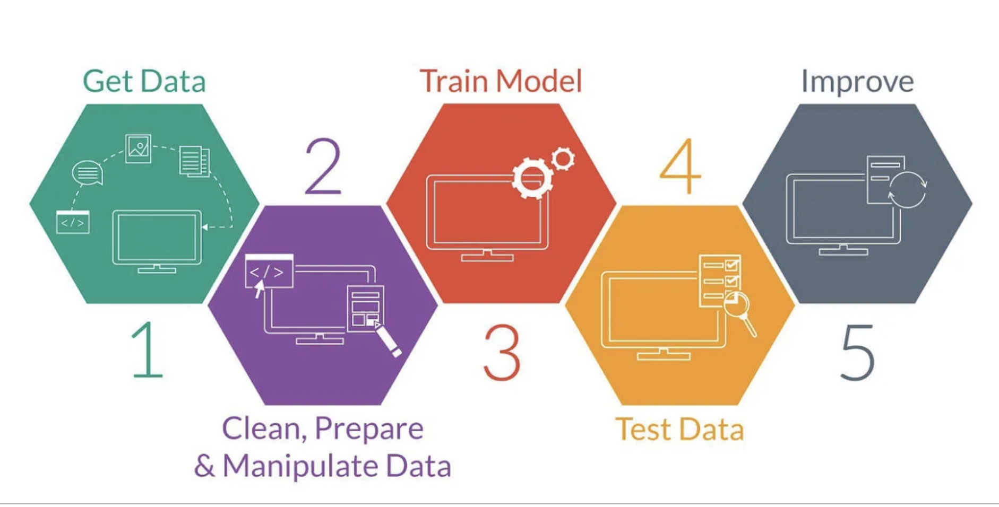

# Overview

# A Setup

# B Exploratory Data Analysis I

1. Read and Visually inspect a subset of data + Combine features and labels into a single dataframe
2. Find out the number of features and samples - Is there a dimensionaity issue compared to the number of samples.
3. Finding the data types for all the columns - and if required, transforming them to make them useful for analysis
4. Looking for missing values 
5. Filter for SJ and look for missing values specifically for SJ
6. Looking for duplicates
7. Initial summary statistics on raw data
8. Feature engineering


# C Exploratory Data Analysis II

9. Total Cases by Season
10. Total Cases by Year and Season
11. Time series of various features for SJ
12. Total cases distribution for all the features.
13. Seasonal decomposition of Total cases
14. Checking Stationarity using  Augmented Dickey-Fuller (ADF)
15. Plotting ACF and PACF graphs

# D Data processing

16. Impute missing values
17. Identify and Impute outliers
18. Train and Test split for Univariate model


# E : MODELS FOR UNIVARIATE TIME SERIES
19. Univariate Prophet - default model
20. Univariate Prophet - Hyperparameter Tuning, cross-validation & Backtesting
21. Univariate SARIMA

# F : MODELS FOR MULTIVARIATE TIME SERIES
22. Train and Test split for Univariate models
23. Multivariate Prophet
24. Multivariate Prophet - Hyperparameter Tuning, cross-validation & Backtesting

# G  :Conclusion

# H : Prediction on Test Data

# I :  Future improvements


# A : Set up : Import the required libraries 

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime, date 
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.stattools import adfuller 
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import mean_absolute_error, mean_squared_error
import math
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm
from pandas.plotting import autocorrelation_plot
from sklearn.model_selection import train_test_split
from sklearn import metrics
%matplotlib inline 
import matplotlib.pyplot as plt 
import matplotlib.gridspec as gridspec # subplots
import seaborn as sns; sns.set()
pd.options.display.max_columns = None
pd.options.display.max_rows = None
import time
import itertools 
from prophet import Prophet
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric
from prophet.diagnostics import cross_validation


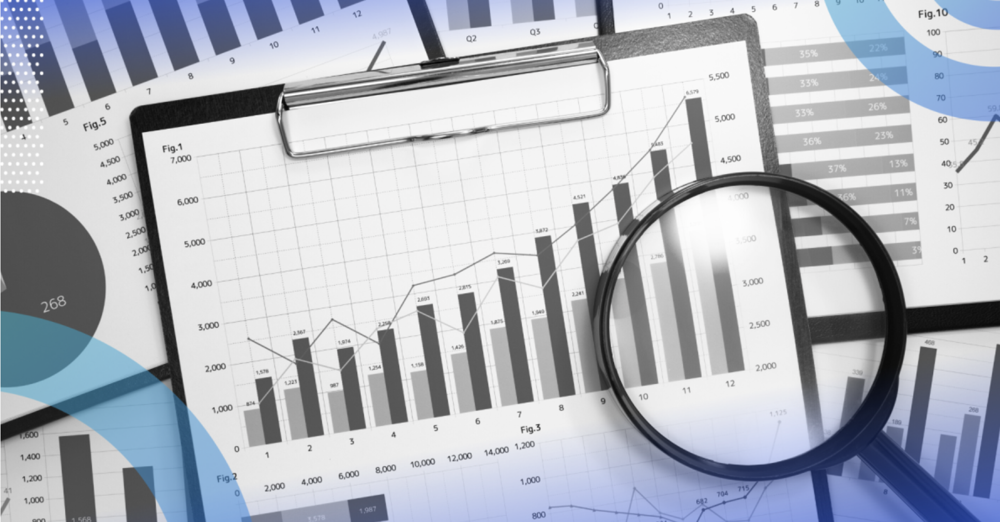

# B : Exploratory Data Analysis I

1. Read and Visually inspect a subset of data + Combine features and labels into a single dataframe

2. Find out the number of features and samples - Is there a dimensionaity issue compared to the number of samples.
 
3. Finding the data types for all the columns - and if required, transforming them to make them useful for analysis

4. Looking for missing values 

5. Filter for SJ and look for missing values specifically for SJ

6. Looking for duplicates

7. Initial summary statistics on raw data

8. Feature engineering


# 1. Read and Visually inspect a subset of data + Combine features and labels into a single dataframe

In [2]:
# 1a. Visually inspect a subset of Features data
X = pd.read_csv("DengAI_Predicting_Disease_Spread_-_Training_Data_Features.csv", header = 0)

# 1b. Visually inspect a subset of Labels data
Y = pd.read_csv("DengAI_Predicting_Disease_Spread_-_Training_Data_Labels.csv", header = 0)

# 1c. Combine Features with Labels in a single Dataframe
df = X.merge(Y, how='inner', on=['city','year','weekofyear'])

# 1d. Transform Date into Datetimens64 format
df['week_start_date'] = pd.to_datetime(df['week_start_date']).dt.date.astype('datetime64[ns]')

df.head()

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,3
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,6


# 2. Find out the number of features and samples - Is there a dimensionaity issue compared to the number of samples.
   

In [3]:
print("-"*100)
print("X shape", X.shape)
# print("-"*100)
# print("X info")
# print("-"*100)
# print(X.info())
print("-"*100)
print("Y shape", Y.shape)
# print("-"*100)
# print("Y info")
# print("-"*100)
# print(Y.info())
print("-"*100)
print("df shape", df.shape)
print("-"*100)


----------------------------------------------------------------------------------------------------
X shape (1456, 24)
----------------------------------------------------------------------------------------------------
Y shape (1456, 4)
----------------------------------------------------------------------------------------------------
df shape (1456, 25)
----------------------------------------------------------------------------------------------------


Observation : We have 1456 samples. 24 features and 1 target column.

# 3. Finding the data types for all the columns - and if required, transforming them to make them useful for analysis


In [4]:
print("df info")
print("-"*100)
print(df.info())
print("-"*100)

df info
----------------------------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1456 entries, 0 to 1455
Data columns (total 25 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   city                                   1456 non-null   object        
 1   year                                   1456 non-null   int64         
 2   weekofyear                             1456 non-null   int64         
 3   week_start_date                        1456 non-null   datetime64[ns]
 4   ndvi_ne                                1262 non-null   float64       
 5   ndvi_nw                                1404 non-null   float64       
 6   ndvi_se                                1434 non-null   float64       
 7   ndvi_sw                                1434 non-null   float64       
 8   precipitation_amt_mm         

Observation : All the columns except city are numeric. I have filtered the data based on city for the analysis, hence there is no need to convert city into a numeric representation

# 4. Looking for missing values 

In [5]:
# 4. Missing values

df.isnull().sum()

city                                       0
year                                       0
weekofyear                                 0
week_start_date                            0
ndvi_ne                                  194
ndvi_nw                                   52
ndvi_se                                   22
ndvi_sw                                   22
precipitation_amt_mm                      13
reanalysis_air_temp_k                     10
reanalysis_avg_temp_k                     10
reanalysis_dew_point_temp_k               10
reanalysis_max_air_temp_k                 10
reanalysis_min_air_temp_k                 10
reanalysis_precip_amt_kg_per_m2           10
reanalysis_relative_humidity_percent      10
reanalysis_sat_precip_amt_mm              13
reanalysis_specific_humidity_g_per_kg     10
reanalysis_tdtr_k                         10
station_avg_temp_c                        43
station_diur_temp_rng_c                   43
station_max_temp_c                        20
station_mi

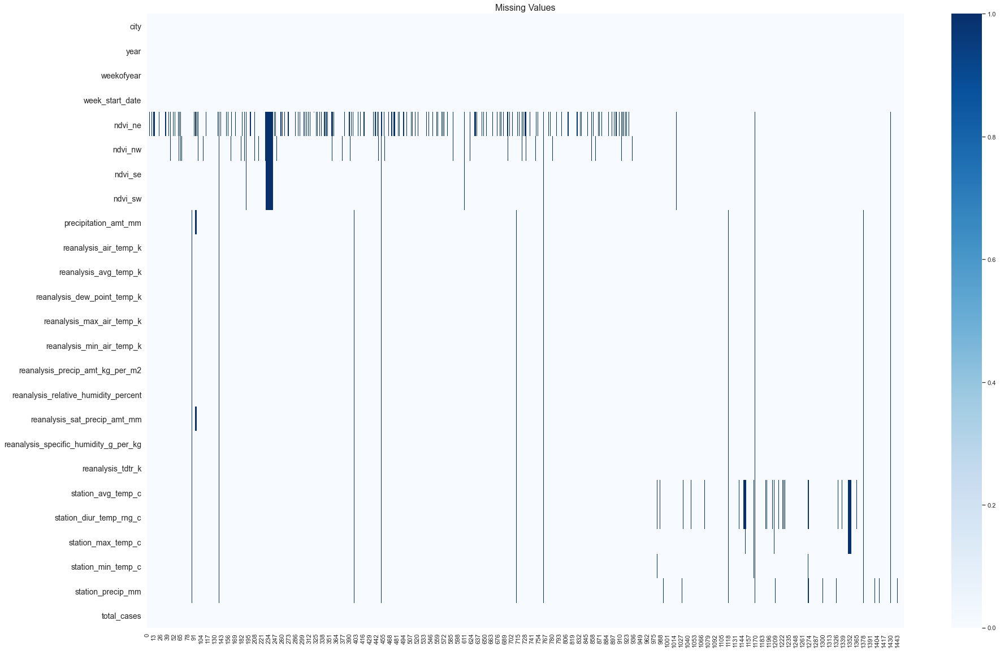

In [6]:
f, ax = plt.subplots(nrows=1, ncols=1, figsize=(30,20))

sns.heatmap(df.T.isna(), cmap='Blues')
ax.set_title('Missing Values', fontsize=16)

for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(14)
plt.show()


Observation :

The above plot shows the missing values by feature and sample. X axis is the sample number and Y axis has the different features.

We notice that there are ~10 samples with most features missing 
The feature ndvi_ne has too many missing values for the first 950 samples and very few missing values after that.
The features station_avg_temp_c, station_diur_temp_rng_c, station_precip_mm have more missing values from 975 - 1365 samples

# 5.  Filter the Data for SJ and look for missing values for SJ specifically

In [7]:
df_sj = df[df['city']=='sj']
df_sj.shape


(936, 25)

In [8]:
df_sj.head()

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,3
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,6


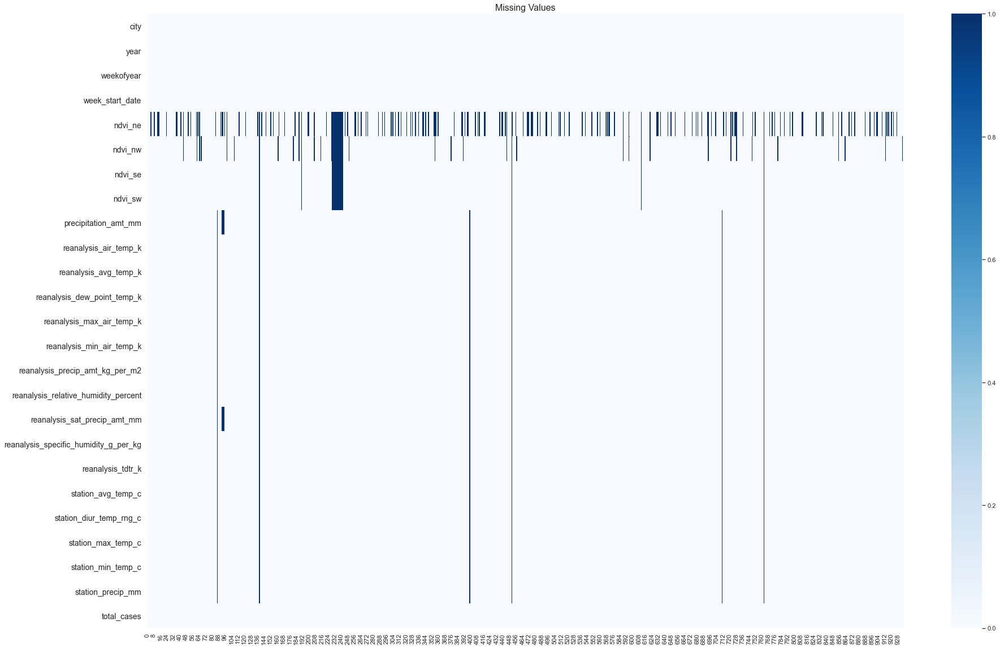

In [9]:
f, ax = plt.subplots(nrows=1, ncols=1, figsize=(30,20))

sns.heatmap(df_sj.T.isna(), cmap='Blues')
ax.set_title('Missing Values', fontsize=16)

for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(14)
plt.show()


Observation :

On filtering for city = SJ and IQ separately and analyzing the missing values we notice that most of the ndvi_ne values are missing for SJ and not missing for IQ.
The feature ndvi_ne is the only feature with a lot of missing values.

# 6. Looking for duplicates

In [10]:
df.duplicated().any()

False

Observation : There were no duplicates found

# 7. Initial summary statistics on raw data

Descriptive statistics include those that summarize the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values.

In [11]:

df.describe(include ='all')

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
count,1456,1456.000000,1456.000000,1456,1262.000000,1404.000000,1434.000000,1434.000000,1443.000000,1446.000000,1446.000000,1446.000000,1446.000000,1446.000000,1446.000000,1446.000000,1443.000000,1446.000000,1446.000000,1413.000000,1413.000000,1436.000000,1442.000000,1434.000000,1456.000000
unique,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,sj,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,936,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,2001.031593,26.503434,2001-07-09 16:01:19.120879104,0.142294,0.130553,0.203783,0.202305,45.760388,298.701852,299.225578,295.246356,303.427109,295.719156,40.151819,82.161959,45.760388,16.746427,4.903754,27.185783,8.059328,32.452437,22.102150,39.326360,24.675137
min,NaN,1990.000000,1.000000,1990-04-30 00:00:00,-0.406250,-0.456100,-0.015533,-0.063457,0.000000,294.635714,294.892857,289.642857,297.800000,286.900000,0.000000,57.787143,0.000000,11.715714,1.357143,21.400000,4.528571,26.700000,14.700000,0.000000,0.000000
25%,NaN,1997.000000,13.750000,1997-04-28 06:00:00,0.044950,0.049217,0.155087,0.144209,9.800000,297.658929,298.257143,294.118929,301.000000,293.900000,13.055000,77.177143,9.800000,15.557143,2.328571,26.300000,6.514286,31.100000,21.100000,8.700000,5.000000
50%,NaN,2002.000000,26.500000,2002-05-28 00:00:00,0.128817,0.121429,0.196050,0.189450,38.340000,298.646429,299.289286,295.640714,302.400000,296.200000,27.245000,80.301429,38.340000,17.087143,2.857143,27.414286,7.300000,32.800000,22.200000,23.850000,12.000000
75%,NaN,2005.000000,39.250000,2005-11-26 00:00:00,0.248483,0.216600,0.248846,0.246982,70.235000,299.833571,300.207143,296.460000,305.500000,297.900000,52.200000,86.357857,70.235000,17.978214,7.625000,28.157143,9.566667,33.900000,23.300000,53.900000,28.000000
max,NaN,2010.000000,53.000000,2010-06-25 00:00:00,0.508357,0.454429,0.538314,0.546017,390.600000,302.200000,302.928571,298.450000,314.000000,299.900000,570.500000,98.610000,390.600000,20.461429,16.028571,30.800000,15.800000,42.200000,25.600000,543.300000,461.000000


# 8. Feature Engineering

#Extract the below components to create new features for Scheduled and Appointment

Numeric ith Month of year : 1,2,3,...12

ith Day of Week Character : Monday, Tuesday, ...

#ith Day of Week Numeric, : 0,1,2,3...6

Day of the Month, : 1,2,3,... (28/29/30/31)

Season 1: Winter, 2:Spring, 3:Summer, 4: Fall

In [12]:

df_sj = df_sj.copy()
df_sj['month'] = df_sj['week_start_date'].dt.month
df_sj['dayofweek_character'] = pd.to_datetime(df_sj['week_start_date']).dt.strftime("%A")
df_sj['dayofweek_numeric'] = df_sj['week_start_date'].dt.dayofweek
df_sj['dayofmonth'] = df_sj['week_start_date'].dt.day
df_sj['season'] = df_sj['month'] % 12 // 3 + 1
df_sj['season_character']  = df_sj['season'].map({1:'Winter', 2:'Spring', 3:'Summer', 4: 'Fall'})
df_sj.head()

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases,month,dayofweek_character,dayofweek_numeric,dayofmonth,season,season_character
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4,4,Monday,0,30,2,Spring
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5,5,Monday,0,7,2,Spring
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,4,5,Monday,0,14,2,Spring
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,3,5,Monday,0,21,2,Spring
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,6,5,Monday,0,28,2,Spring


Comment : We create these features so that we could analyze how total_cases vary over months, seasons

In [13]:
df_sj_ = df_sj.copy()

# C : Exploratory Data Analysis II

9. Total Cases by Season
10. Total Cases by Year and Season
11. Time series of various features for SJ
12. Total cases distribution for all the features.
13. Seasonal decomposition of Total cases
14. Checking Stationarity using  Augmented Dickey-Fuller (ADF)
15. Plotting ACF and PACF graphs

# 9. Total Cases by Season

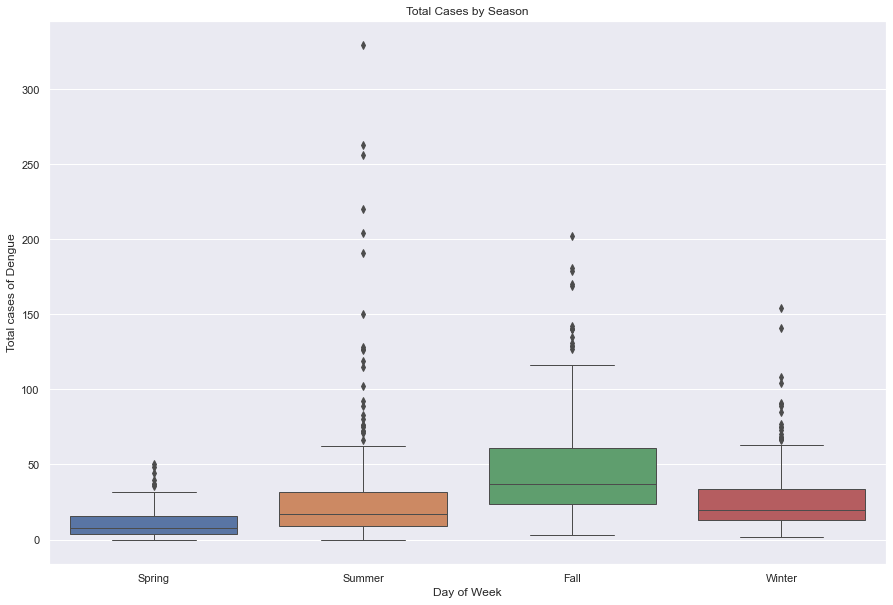

In [14]:
fig, ax = plt.subplots(figsize=(15, 10 ))
sns.boxplot(data=df_sj.dropna(),
            x='season_character',
            y='total_cases',
            ax=ax,
            linewidth=1)
ax.set_title('Total Cases by Season')
ax.set_xlabel('Day of Week')
ax.set_ylabel('Total cases of Dengue')
plt.show()

Observation : Across all years, Dengue cases see a rise in Summer, peak at fall and lessen over winter ( similar to summer) and dip in Spring to the lowest count.

# 10. Total Cases by Year and Season

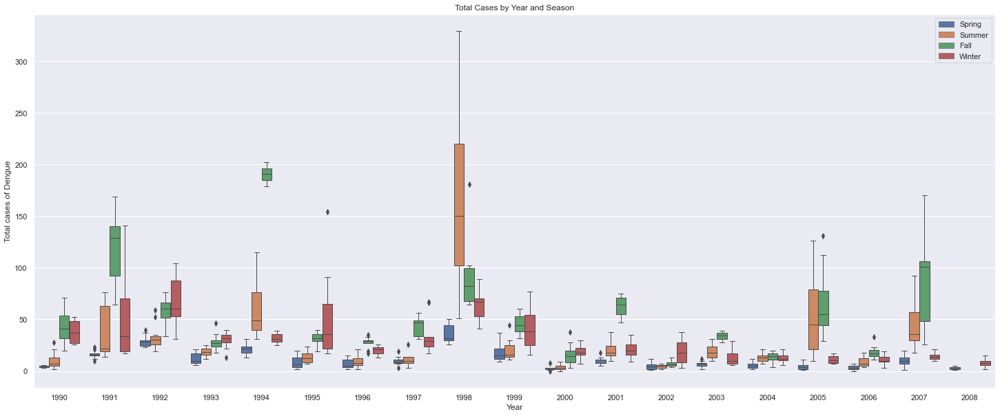

In [15]:
fig, ax = plt.subplots(figsize=(25, 10))
sns.boxplot(data=df_sj.dropna(),
            x='year',
            y='total_cases',
            hue='season_character',
            ax=ax,
            linewidth=1)
ax.set_title('Total Cases by Year and Season')
ax.set_xlabel('Year')
ax.set_ylabel('Total cases of Dengue')
ax.legend(bbox_to_anchor=(1, 1))
plt.show()

Observation : Just like above a similar trend is seen for different years with some variations over the years. It is seen that there is an outlier in 1994 and 1998 and peaks in 1991, 1998, 2005 and 2007

# 11. Time series of various features for SJ

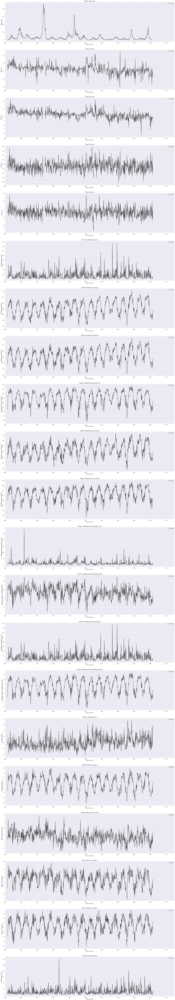

In [16]:
f, ax = plt.subplots(nrows=21, ncols=1, figsize=(35, 210))

for i, column in enumerate(['total_cases','ndvi_ne', 'ndvi_nw','ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 
                            'reanalysis_air_temp_k','reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
                            'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k','reanalysis_precip_amt_kg_per_m2',
                            'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
                            'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k','station_avg_temp_c', 
                            'station_diur_temp_rng_c', 'station_max_temp_c','station_min_temp_c', 
                            'station_precip_mm']): 
    dname = "old_" + str(column)
    dname  = df_sj_[column].copy()
    df_sj = df_sj_.copy()
    df_sj[column] = df_sj[column].replace(0, np.nan)
    sns.lineplot(x=df_sj['week_start_date'], y=dname, ax=ax[i], color='black', label='original')
    ax[i].set_title("Feature: {}".format(column), fontsize=14)
    ax[i].set_ylabel(ylabel=column, fontsize=14)
    ax[i].set_xlim([date(1990, 1, 1), date(2010, 12, 31)])



Observation : Features like Temperature, dew point and humidity are showing strong seasonal patterns which are intuitive. The vegetation index for SE seems to have a constant mean and variance across the years.

# 12. Total cases distribution for all the features.

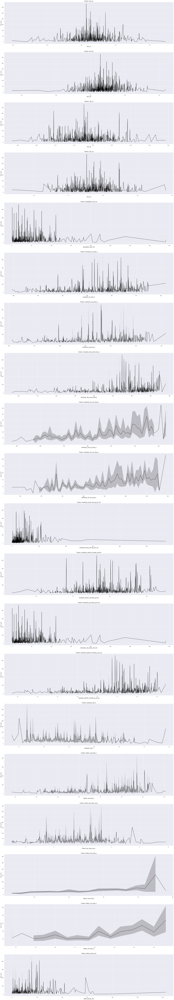

In [17]:
f, ax = plt.subplots(nrows=20, ncols=1, figsize=(35, 210))

for i, column in enumerate(['ndvi_ne', 'ndvi_nw','ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 
                            'reanalysis_air_temp_k','reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
                            'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k','reanalysis_precip_amt_kg_per_m2',
                            'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
                            'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k','station_avg_temp_c', 
                            'station_diur_temp_rng_c', 'station_max_temp_c','station_min_temp_c', 
                            'station_precip_mm']): 
    dname = "old_" + str(column)
    dname  = df_sj_[column].copy()
    df_sj = df_sj_.copy()
    df_sj[column] = df_sj[column].replace(0, np.nan)
    sns.lineplot(x=dname, y=df_sj['total_cases'], ax=ax[i], color='black')
    ax[i].set_title("Feature: {}".format(column), fontsize=14)
    ax[i].set_xlabel(xlabel=column, fontsize=14)
#     ax[i].set_ylabel(ylabel='Total cases', fontsize=14)



# 13. Seasonal decomposition of Total cases

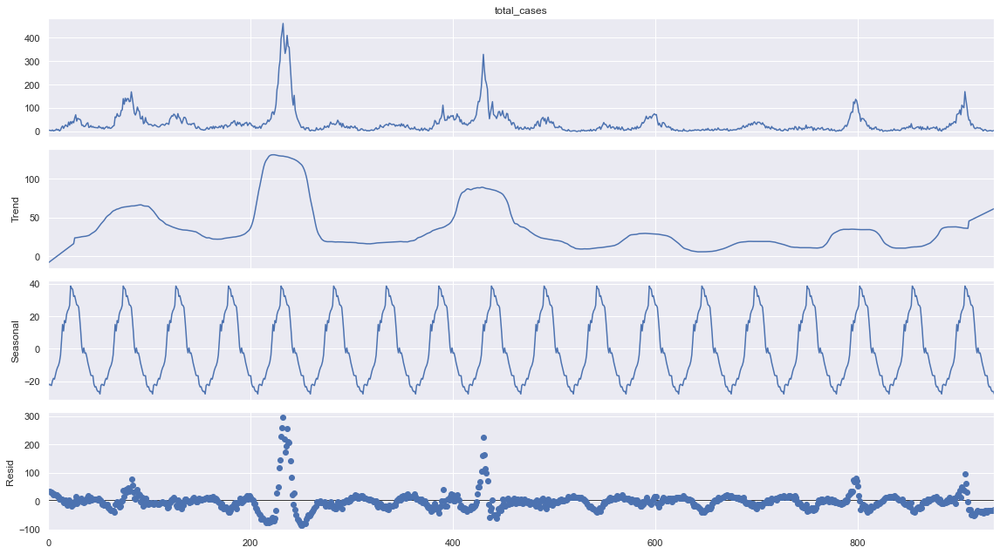

In [18]:
core_columns =  ['total_cases']
for column in core_columns:
    res = seasonal_decompose(df_sj[column], period=52, model='additive', extrapolate_trend='freq')
    fig = res.plot()
    fig.set_size_inches((16, 9))
    fig.tight_layout()
    plt.show()

Observation : We see strong seasonality and not much of trend. We notice there are some sudden peaks in the trend line for 2-3 years which were also visible without the seasonal decomposition.

We also notice that the time series is not multiplicative

# 14. Checking Stationarity using  Augmented Dickey-Fuller (ADF)

In [19]:

adftest = adfuller(df_sj['total_cases'], autolag='AIC', regression='ct')
print("ADF Test Results")
print("")
print("Null Hypothesis: The series is non-stationary")
print("ADF-Statistic  :", adftest[0])
print("P-Value        :", adftest[1])
print("Number of lags :", adftest[2])
print("Number of obs  :", adftest[3])
print("Critical Values:", adftest[4])
print("Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary")

print("Since ",adftest[1]," < 0.05 we reject the null hypothesis and the series is stationary")

ADF Test Results

Null Hypothesis: The series is non-stationary
ADF-Statistic  : -6.892498956487469
P-Value        : 2.470249419563926e-08
Number of lags : 9
Number of obs  : 926
Critical Values: {'1%': -3.9685798879453302, '5%': -3.4152418477485083, '10%': -3.1298468301952087}
Note: If P-Value is smaller than 0.05, we reject the null hypothesis and the series is stationary
Since  2.470249419563926e-08  < 0.05 we reject the null hypothesis and the series is stationary


Observation : Based on the ADF test, the timeseries is not stationary.

# 15. ACF and PACF graphs

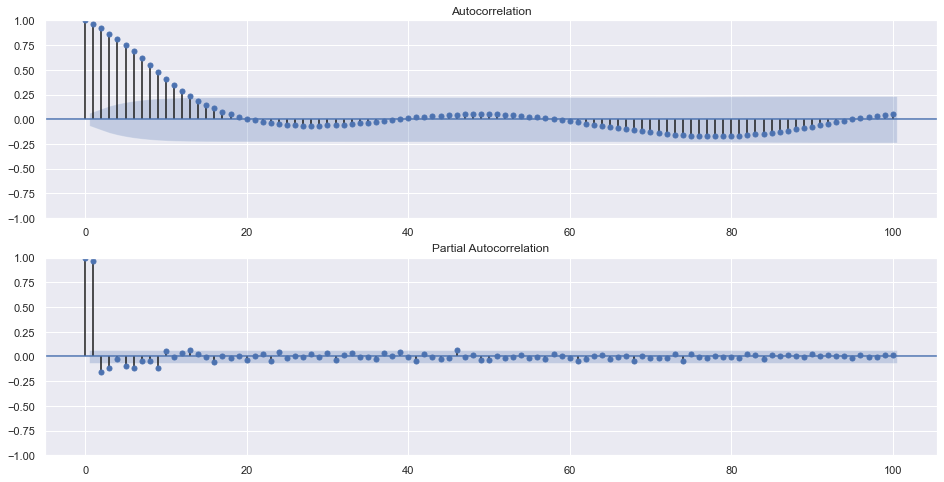

In [20]:

f, ax = plt.subplots(nrows=2, ncols=1, figsize=(16, 8))

plot_acf(df_sj['total_cases'], lags=100, ax=ax[0])
plot_pacf(df_sj['total_cases'], lags=100, ax=ax[1])

plt.show()

Observation : We see 2 weeks of lag as significant in the PACF plot implying the Auto regressive model with p = 2. 
And there is an decay in the ACF plot implying that this could be an AR 1 model, since the series is stationary.

# D : Data Processing

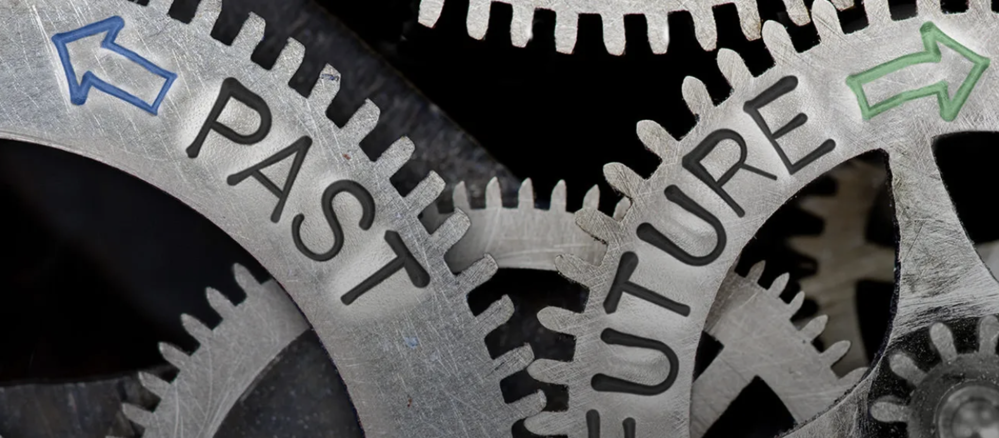

# 16. Missing value imputation

In [21]:
df_sj_wo_imputation = df_sj.copy()
for i, column in enumerate(['ndvi_ne', 'ndvi_nw','ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 
                            'reanalysis_air_temp_k','reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
                            'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k','reanalysis_precip_amt_kg_per_m2',
                            'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
                            'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k','station_avg_temp_c', 
                            'station_diur_temp_rng_c', 'station_max_temp_c','station_min_temp_c', 
                            'station_precip_mm', 'total_cases']): 
    df_sj_wo_imputation[column] = df_sj_wo_imputation[column].interpolate()
        

In [22]:
df_sj = df_sj.copy()
for i, column in enumerate(['ndvi_ne', 'ndvi_nw','ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 
                            'reanalysis_air_temp_k','reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
                            'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k','reanalysis_precip_amt_kg_per_m2',
                            'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
                            'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k','station_avg_temp_c', 
                            'station_diur_temp_rng_c', 'station_max_temp_c','station_min_temp_c', 
                            'station_precip_mm', 'total_cases']): 
    df_sj[column] = df_sj[column].interpolate()
    

# 17. Identify outliers

In [23]:
def detect_outliers_zscore(data, threshold=3):
    """
    Detect outliers in a time series data using z-score method.
    
    Parameters:
        data (pd.Series): Time series data.
        threshold (float): Threshold for the z-score. Data points with z-score greater than
                           this threshold are considered outliers. Default is 3.
    
    Returns:
        pd.Series: A boolean series indicating outliers.
    """
    # Calculate z-score
    z_scores = (data - data.mean()) / data.std()
    
    # Mark outliers
    outliers = np.abs(z_scores) > threshold
    
    return outliers

for i, column in enumerate([
                            'ndvi_ne', 'ndvi_nw','ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 
                            'reanalysis_air_temp_k','reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
                            'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k','reanalysis_precip_amt_kg_per_m2',
                            'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
                            'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k','station_avg_temp_c', 
                            'station_diur_temp_rng_c', 'station_max_temp_c','station_min_temp_c', 
                            'station_precip_mm', 'total_cases']): 
    
    input_time_series = df_sj.copy()
    input_time_series.set_index('week_start_date', inplace = True)
    input_time_series = input_time_series[column]

    # Detect outliers using z-score method
    outliers = detect_outliers_zscore(input_time_series)

    # Print identified outliers
    print("-"*100)
    print("Outliers identified using z-score method for : ", column )
    print("-"*100)
    print(input_time_series[outliers])
    

----------------------------------------------------------------------------------------------------
Outliers identified using z-score method for :  ndvi_ne
----------------------------------------------------------------------------------------------------
week_start_date
1991-02-05    0.380100
1993-12-17   -0.290200
2000-03-11    0.377900
2000-04-22   -0.287000
2000-10-14    0.380000
2001-02-26    0.446267
2001-03-12    0.422900
2004-01-01   -0.268300
2004-03-25   -0.406250
2004-04-08    0.493400
2006-02-12   -0.308400
2006-11-12   -0.276100
2007-11-05   -0.251700
2008-03-11   -0.321400
Name: ndvi_ne, dtype: float64
----------------------------------------------------------------------------------------------------
Outliers identified using z-score method for :  ndvi_nw
----------------------------------------------------------------------------------------------------
week_start_date
1990-09-10    0.4371
2001-03-12    0.4229
2002-12-24   -0.2528
2005-05-07   -0.2498
2006-11-19   -0.

Observation : We identify all the outliers. I would have liked to plot these outliers and visualize them and then finally remove/impute those. But I was unable to do it in the interest of time.

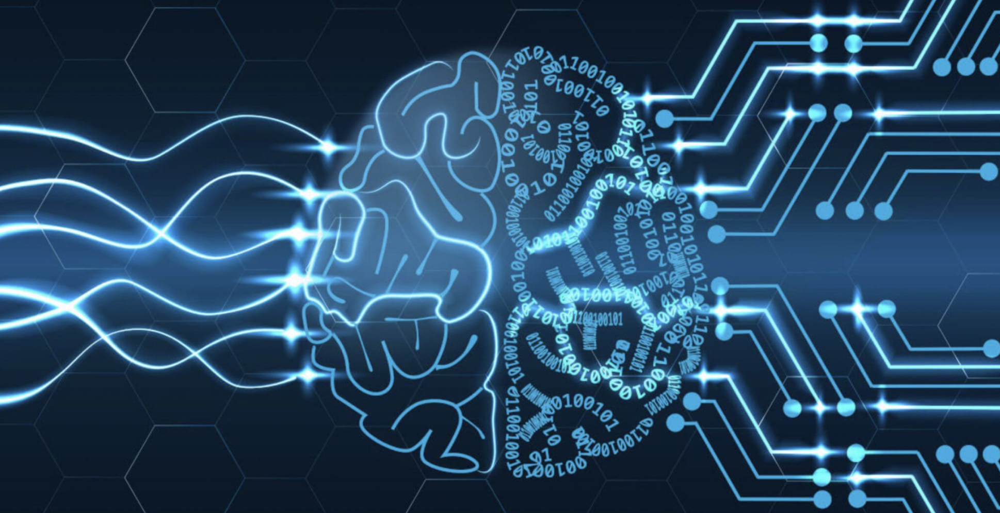

# MODELS FOR UNIVARIATE TIME SERIES

# 18. Train and Test split for Univariate models

In [24]:
train_size = int(0.85 * len(df_sj))
test_size = len(df_sj) - train_size

univariate_df = df_sj[['week_start_date', 'total_cases']].copy()
univariate_df.columns = ['ds', 'y']

train = univariate_df.iloc[:train_size, :]
valid = univariate_df.iloc[train_size :, :]

x_train, y_train = pd.DataFrame(univariate_df.iloc[:train_size, 0]), pd.DataFrame(univariate_df.iloc[:train_size, 1])
x_valid, y_valid_actual = pd.DataFrame(univariate_df.iloc[train_size:, 0]), pd.DataFrame(univariate_df.iloc[train_size:, 1])

print(len(train), len(x_valid))

795 141


# 19. Prophet - Univariate - default model

In [25]:
# Train the model
model = Prophet()
model.fit(train)

# Predict on valid set
y_pred = model.predict(x_valid)
pred = y_pred['yhat']

# Calcuate metrics
score_mae = mean_absolute_error(y_valid_actual, pred)
score_rmse = math.sqrt(mean_squared_error(y_valid_actual,pred))

print( 'MAE: {}'.format(score_mae))
print('RMSE: {}'.format(score_rmse))


01:26:09 - cmdstanpy - INFO - Chain [1] start processing
01:26:09 - cmdstanpy - INFO - Chain [1] done processing


MAE: 27.17191464149467
RMSE: 37.94895638888518


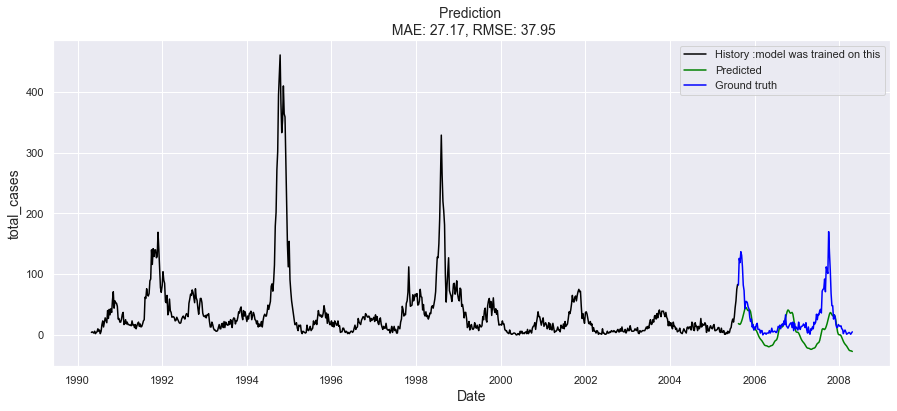

In [26]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(6)
f.set_figwidth(15)

sns.lineplot(x=train['ds'], y=train['y'], ax=ax, color='black', label='History :model was trained on this')
sns.lineplot(x=y_pred['ds'], y=y_pred['yhat'], ax=ax, color='green', label='Predicted')
sns.lineplot(x=x_valid['ds'], y=y_valid_actual['y'], ax=ax, color='blue', label='Ground truth') #navajowhite

ax.set_title(f'Prediction \n MAE: {score_mae:.2f}, RMSE: {score_rmse:.2f}', fontsize=14)
ax.set_xlabel(xlabel='Date', fontsize=14)
ax.set_ylabel(ylabel='total_cases', fontsize=14)

plt.show()

Observation : The fit on Validation does not look good

# 20. Univariate Prophet - Hyperparameter Tuning, cross-validation & Backtesting
Ranges give on Prophet's documentation

changepoint_prior_scale [0.001, 0.5]

seasonality_prior_scale [0.01, 10]

holidays_prior_scale [0.01, 10]

seasonality_mode ['additive', 'multiplicative'].

changepoint_range [0.5, 0.95]

https://facebook.github.io/prophet/docs/diagnostics.html

    
    

In [27]:
changepoint_prior_scale_range = np.linspace(0.001, 0.5, num=5).tolist()
print(changepoint_prior_scale_range)

[0.001, 0.12575, 0.2505, 0.37525, 0.5]


In [28]:
seasonality_prior_scale_range = np.linspace(0.01, 10, num=5).tolist()
print(seasonality_prior_scale_range)

[0.01, 2.5075, 5.005, 7.5024999999999995, 10.0]


# Below is a screenshot of previous training results. Have commented the training code for now as I use the saved tuned parameters for model prediction

{'changepoint_prior_scale': 0.5,

 'seasonality_prior_scale': 0.01,
 
 'mape': 2.252608028194419,
 
 'column': 'total_cases'}

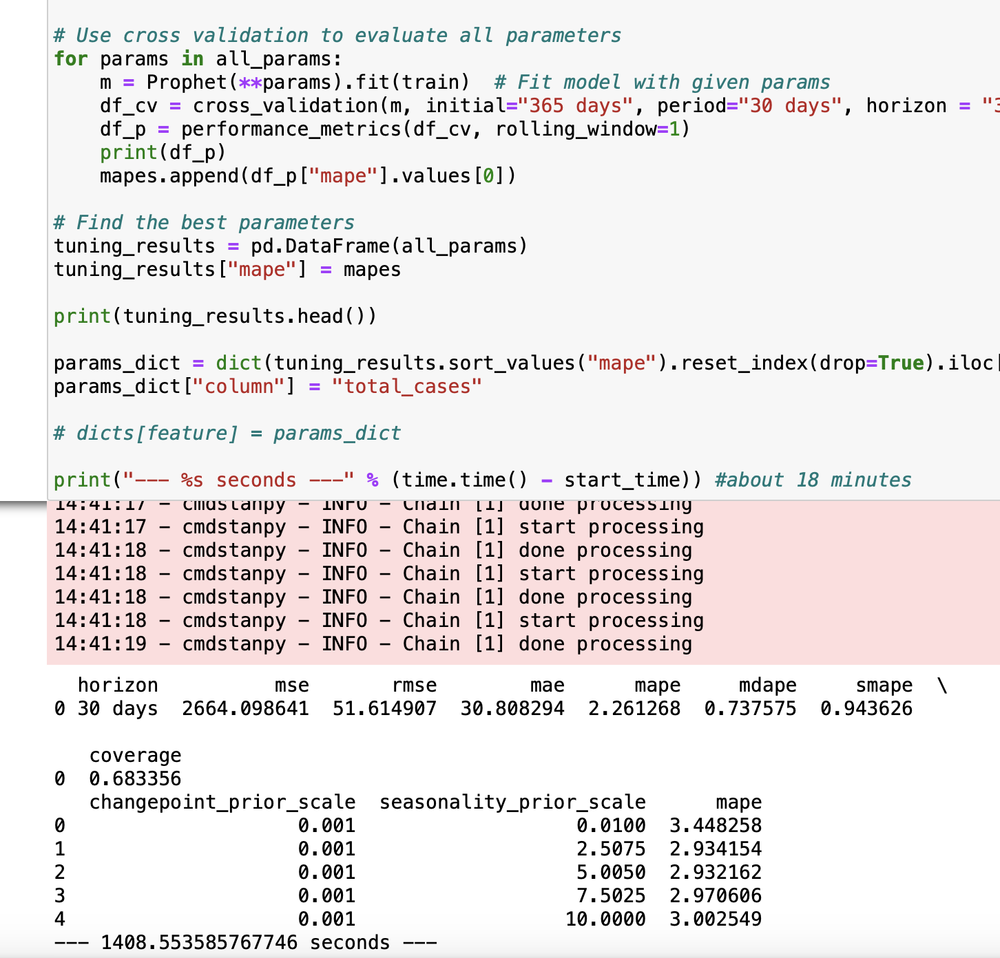

# Optimal model parameters

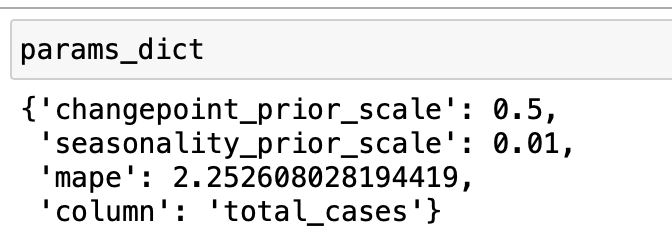

In [29]:
# start_time = time.time()

    
# param_grid = {  
#     "changepoint_prior_scale": changepoint_prior_scale_range,
#     "seasonality_prior_scale": seasonality_prior_scale_range }

# # Generate all combinations of parameters
# all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]

# mapes = [] 

# # Use cross validation to evaluate all parameters
# for params in all_params:
#     m = Prophet(**params).fit(train)  # Fit model with given params
#     df_cv = cross_validation(m, initial="365 days", period="30 days", horizon = "30 days") #took parallel out
#     df_p = performance_metrics(df_cv, rolling_window=1)
#     print(df_p)
#     mapes.append(df_p["mape"].values[0])

# # Find the best parameters
# tuning_results = pd.DataFrame(all_params)
# tuning_results["mape"] = mapes

# print(tuning_results.head())

# params_dict = dict(tuning_results.sort_values("mape").reset_index(drop=True).iloc[0])
# params_dict["column"] = "total_cases" 

# # dicts[feature] = params_dict

# print("--- %s seconds ---" % (time.time() - start_time)) #about 23 minutes

In [30]:
params_dict = {'changepoint_prior_scale': 0.5,
 'seasonality_prior_scale': 0.01,
 'mape': 2.252608028194419,
 'column': 'total_cases'}

In [31]:
#PROPHET MODEL

params_dict = {'changepoint_prior_scale': 0.5,
 'seasonality_prior_scale': 0.01,
 'mape': 2.252608028194419,
 'column': 'total_cases'}

m = Prophet(changepoint_prior_scale = params_dict['changepoint_prior_scale'],
            seasonality_prior_scale = params_dict['seasonality_prior_scale'],
             )

m.fit(train)

y_pred = m.predict(x_valid)
pred = y_pred['yhat']

# Calcuate metrics
score_mae = mean_absolute_error(y_valid_actual, pred)
score_rmse = math.sqrt(mean_squared_error(y_valid_actual,pred))

print( 'MAE: {}'.format(score_mae))
print('RMSE: {}'.format(score_rmse))



01:26:09 - cmdstanpy - INFO - Chain [1] start processing
01:26:10 - cmdstanpy - INFO - Chain [1] done processing


MAE: 20.097238400619055
RMSE: 30.48416860386503


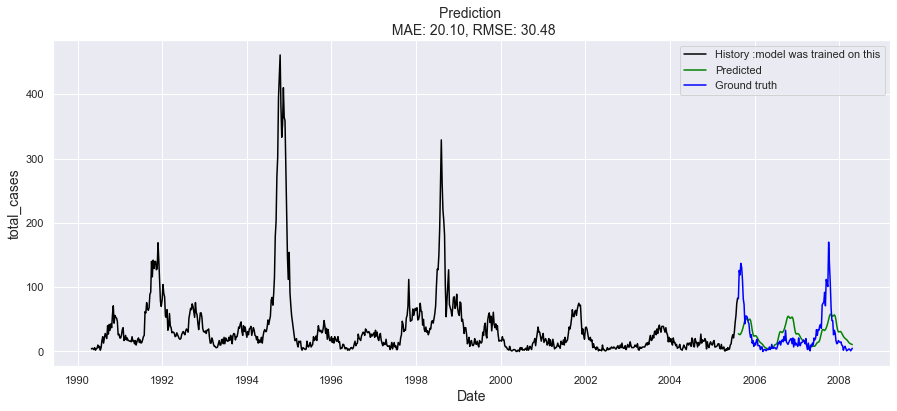

In [32]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(6)
f.set_figwidth(15)

sns.lineplot(x=train['ds'], y=train['y'], ax=ax, color='black', label='History :model was trained on this')
sns.lineplot(x=y_pred['ds'], y=y_pred['yhat'], ax=ax, color='green', label='Predicted')
sns.lineplot(x=x_valid['ds'], y=y_valid_actual['y'], ax=ax, color='blue', label='Ground truth') #navajowhite

ax.set_title(f'Prediction \n MAE: {score_mae:.2f}, RMSE: {score_rmse:.2f}', fontsize=14)
ax.set_xlabel(xlabel='Date', fontsize=14)
ax.set_ylabel(ylabel='total_cases', fontsize=14)

plt.show()

Observation : The fit on Validation looks better than the previous default model

# 21. Univariate SARIMA

In [33]:
model = pm.auto_arima(y_train, 
                      start_p =1,    # minimum p
                      max_p   =3,    # maximum p
                      start_q =1,    # minimum q
                      max_q   =3,    # maximum q
                      
                      m=1,           # frequency of series
                      test='adf',    # use adftest to find optimal 'd'
                      d=None,        # let model determine 'd'
                      
                      seasonal=True, # Seasonality
                      start_P=0,     # Seasonality min P
                      D=0,           # Seasonality order of D
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=6404.099, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=8595.308, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=6427.086, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=7763.261, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=8878.917, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=6380.019, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=6398.329, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=6391.721, Time=0.36 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=6380.479, Time=0.39 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=6394.545, Time=0.19 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=6393.394, Time=0.15 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=6380.487, Time=1.14 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=6392.122, Time=0.13 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 3.051 seconds


In [34]:
# Predictions
y_pred = model.predict(n_periods=len(x_valid))

In [35]:
# Calcuate metrics
score_mae = mean_absolute_error(y_valid_actual, y_pred)
score_rmse = math.sqrt(mean_squared_error(y_valid_actual, y_pred))
print( 'MAE: {}'.format(score_mae))
print( 'RMSE: {}'.format(score_rmse))

MAE: 26.61751827644783
RMSE: 31.256617343290408


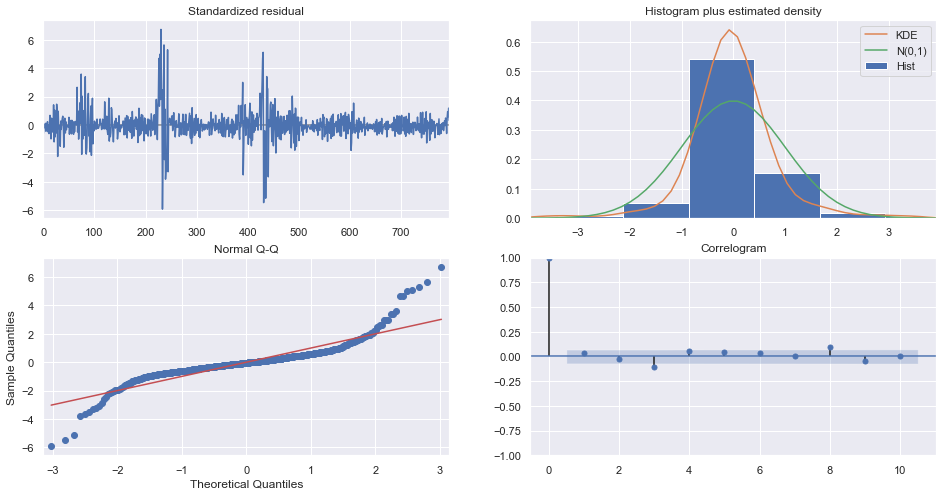

In [36]:
model.plot_diagnostics(figsize=(16,8))
plt.show()

Observation : The residuals do not seem to have changing variance and do not seem to be normal. Hence this model is not good and needs to be improved.

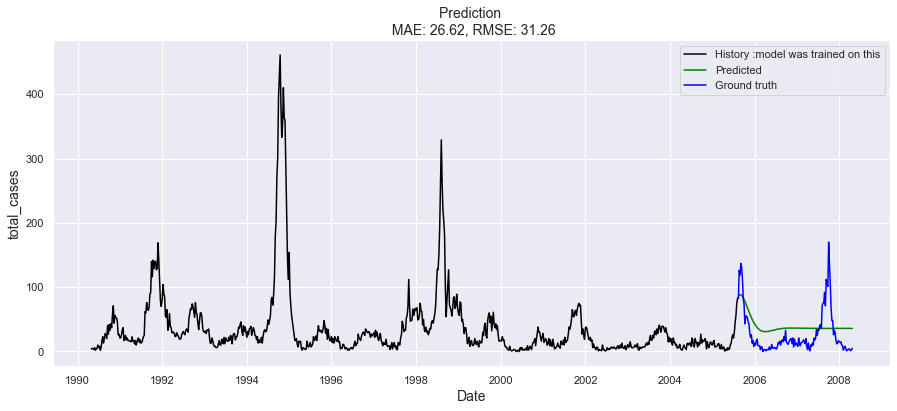

In [37]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(6)
f.set_figwidth(15)

sns.lineplot(x=train['ds'], y=train['y'], ax=ax, color='black', label='History :model was trained on this')
sns.lineplot(x=x_valid['ds'], y=y_pred, ax=ax, color='green', label='Predicted')
sns.lineplot(x=x_valid['ds'], y=y_valid_actual['y'], ax=ax, color='blue', label='Ground truth') #navajowhite

ax.set_title(f'Prediction \n MAE: {score_mae:.2f}, RMSE: {score_rmse:.2f}', fontsize=14)
ax.set_xlabel(xlabel='Date', fontsize=14)
ax.set_ylabel(ylabel='total_cases', fontsize=14)

plt.show()

Observation : The fit on Validation does not look good

# F : MODELS FOR MULTIVARIATE TIME SERIES

# 22. Train and Test split for Univariate models

In [38]:
df_sj['floor'] = 0
feature_columns = [
'ndvi_ne', 'ndvi_nw','ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 
'reanalysis_air_temp_k','reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k','reanalysis_precip_amt_kg_per_m2',
'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k','station_avg_temp_c', 
'station_diur_temp_rng_c', 'station_max_temp_c','station_min_temp_c', 
'station_precip_mm','floor',
]
                        
target_column = ['total_cases']

train_size = int(0.85 * len(df_sj))

multivariate_df = df_sj[['week_start_date'] + target_column + feature_columns].copy()
multivariate_df.columns = ['ds', 'y'] + feature_columns

train = multivariate_df.iloc[:train_size, :]
x_train, y_train = pd.DataFrame(multivariate_df.iloc[:train_size, [0,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21]]), pd.DataFrame(multivariate_df.iloc[:train_size, 1])
x_valid, y_valid = pd.DataFrame(multivariate_df.iloc[train_size:, [0,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21]]), pd.DataFrame(multivariate_df.iloc[train_size:, 1])

train.head()

,ds,y,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,floor
0,1990-04-30,4,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,0
1,1990-05-07,5,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,0
2,1990-05-14,4,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,0
3,1990-05-21,3,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,0
4,1990-05-28,6,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,0


# 23. Multivariate Prophet

In [39]:

# Train the model
model = Prophet()
model.add_regressor('ndvi_ne')
model.add_regressor('ndvi_nw')
model.add_regressor('ndvi_se')
model.add_regressor('ndvi_sw')
model.add_regressor('precipitation_amt_mm')
model.add_regressor('reanalysis_air_temp_k')
model.add_regressor('reanalysis_avg_temp_k')
model.add_regressor('reanalysis_dew_point_temp_k')
model.add_regressor('reanalysis_max_air_temp_k')
model.add_regressor('reanalysis_min_air_temp_k')
model.add_regressor('reanalysis_precip_amt_kg_per_m2')
model.add_regressor('reanalysis_relative_humidity_percent')
model.add_regressor('reanalysis_sat_precip_amt_mm')
model.add_regressor('reanalysis_specific_humidity_g_per_kg')
model.add_regressor('reanalysis_tdtr_k')
model.add_regressor('station_avg_temp_c')
model.add_regressor('station_diur_temp_rng_c')
model.add_regressor('station_max_temp_c')
model.add_regressor('station_min_temp_c')
model.add_regressor('station_precip_mm')


# Fit the model with train set
m = model.fit(train)

# Predict on valid set
y_pred = model.predict(x_valid)

# Calcuate metrics
score_mae = mean_absolute_error(y_valid, y_pred['yhat'])
score_rmse = math.sqrt(mean_squared_error(y_valid, y_pred['yhat']))
print( 'MAE: {}'.format(score_mae))
print( 'RMSE: {}'.format(score_rmse))

01:26:16 - cmdstanpy - INFO - Chain [1] start processing
01:26:16 - cmdstanpy - INFO - Chain [1] done processing


MAE: 28.98785662730756
RMSE: 39.500595544502005


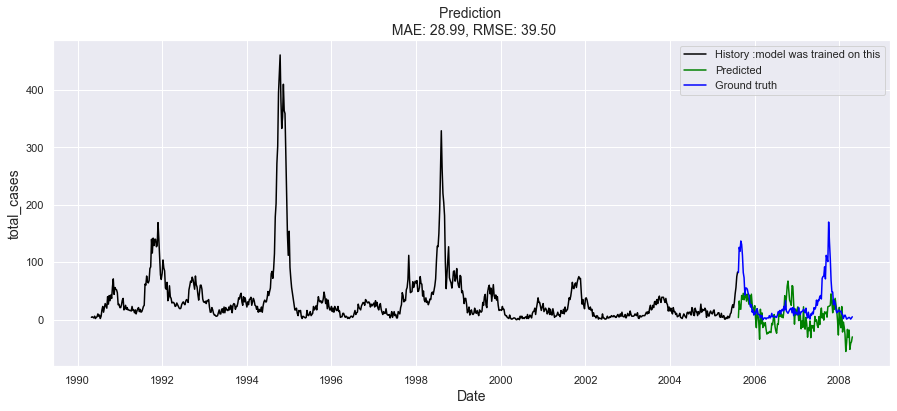

In [40]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(6)
f.set_figwidth(15)

# model.plot(y_pred, ax=ax)
sns.lineplot(x=train['ds'], y=train['y'], ax=ax, color='black', label='History :model was trained on this')
sns.lineplot(x=y_pred['ds'], y=y_pred['yhat'], ax=ax, color='green', label='Predicted')
sns.lineplot(x=x_valid['ds'], y=y_valid_actual['y'], ax=ax, color='blue', label='Ground truth') #navajowhite

ax.set_title(f'Prediction \n MAE: {score_mae:.2f}, RMSE: {score_rmse:.2f}', fontsize=14)
ax.set_xlabel(xlabel='Date', fontsize=14)
ax.set_ylabel(ylabel='total_cases', fontsize=14)

plt.show()

Observation : The fit on Validation does not look good

# 24. Multivariate Prophet - Hyperparameter Tuning, cross-validation & Backtesting


# Below is a screenshot of previous training results. Have commented the training code for now as I use the saved tuned parameters for model prediction

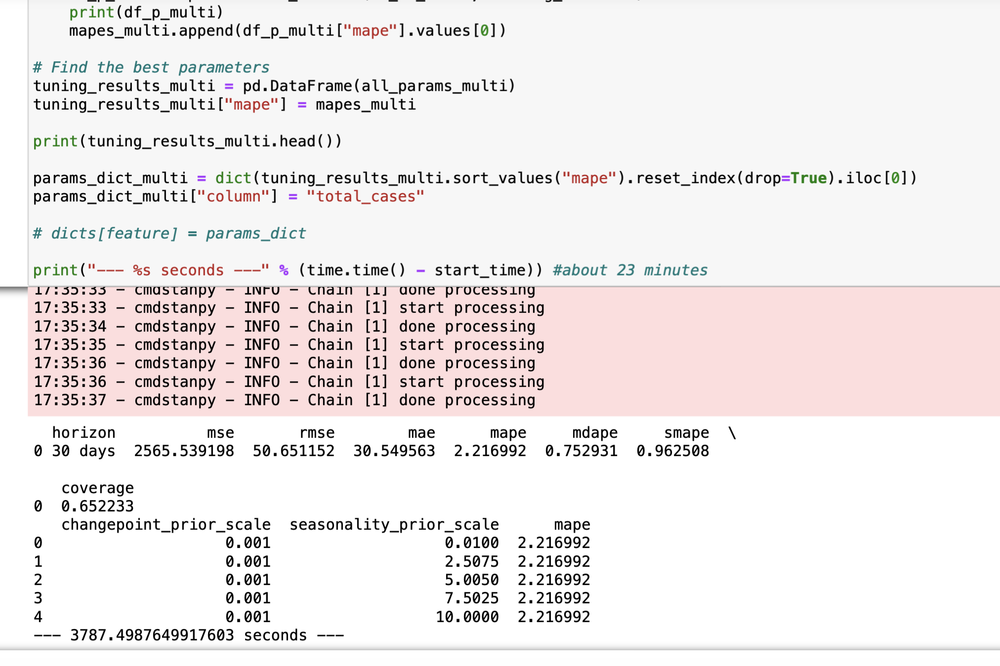

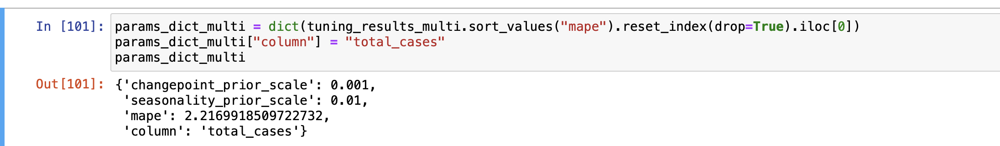

In [41]:
# start_time = time.time()

    
# param_grid_multi = {  
#     "changepoint_prior_scale": changepoint_prior_scale_range,
#     "seasonality_prior_scale": seasonality_prior_scale_range }

# # Generate all combinations of parameters
# all_params_multi = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]

# mapes_multi = [] 

# # Use cross validation to evaluate all parameters
# for params_multi in all_params_multi:
#     m_multi = Prophet(**params)
#     m_multi.add_regressor('ndvi_ne')
#     m_multi.add_regressor('ndvi_nw')
#     m_multi.add_regressor('ndvi_se')
#     m_multi.add_regressor('ndvi_sw')
#     m_multi.add_regressor('precipitation_amt_mm')
#     m_multi.add_regressor('reanalysis_air_temp_k')
#     m_multi.add_regressor('reanalysis_avg_temp_k')
#     m_multi.add_regressor('reanalysis_dew_point_temp_k')
#     m_multi.add_regressor('reanalysis_max_air_temp_k')
#     m_multi.add_regressor('reanalysis_min_air_temp_k')
#     m_multi.add_regressor('reanalysis_precip_amt_kg_per_m2')
#     m_multi.add_regressor('reanalysis_relative_humidity_percent')
#     m_multi.add_regressor('reanalysis_sat_precip_amt_mm')
#     m_multi.add_regressor('reanalysis_specific_humidity_g_per_kg')
#     m_multi.add_regressor('reanalysis_tdtr_k')
#     m_multi.add_regressor('station_avg_temp_c')
#     m_multi.add_regressor('station_diur_temp_rng_c')
#     m_multi.add_regressor('station_max_temp_c')
#     m_multi.add_regressor('station_min_temp_c')
#     m_multi.add_regressor('station_precip_mm')
#     model_multi = m_multi.fit(train)  # Fit model with given params

#     df_cv_multi = cross_validation(model_multi, initial="365 days", period="30 days", horizon = "30 days") #took parallel out
#     df_p_multi = performance_metrics(df_cv_multi, rolling_window=1)
#     print(df_p_multi)
#     mapes_multi.append(df_p_multi["mape"].values[0])

# # Find the best parameters
# tuning_results_multi = pd.DataFrame(all_params_multi)
# tuning_results_multi["mape"] = mapes_multi

# print(tuning_results_multi.head())

# params_dict_multi = dict(tuning_results_multi.sort_values("mape").reset_index(drop=True).iloc[0])
# params_dict_multi["column"] = "total_cases" 

# # dicts[feature] = params_dict

# print("--- %s seconds ---" % (time.time() - start_time)) #about 23 minutes

In [42]:
params_dict_multi ={'changepoint_prior_scale': 0.001,
 'seasonality_prior_scale': 0.01,
 'mape': 2.2169918509722732,
 'column': 'total_cases'}

In [43]:
m = Prophet(changepoint_prior_scale = params_dict_multi['changepoint_prior_scale'],
            seasonality_prior_scale = params_dict_multi['seasonality_prior_scale'],

             )

m.fit(train)

y_pred = m.predict(x_valid)
pred = y_pred['yhat']

# Calcuate metrics
score_mae = mean_absolute_error(y_valid_actual, pred)
score_rmse = math.sqrt(mean_squared_error(y_valid_actual,pred))

print( 'MAE: {}'.format(score_mae))
print('RMSE: {}'.format(score_rmse))

01:26:16 - cmdstanpy - INFO - Chain [1] start processing
01:26:17 - cmdstanpy - INFO - Chain [1] done processing


MAE: 17.799704613738257
RMSE: 31.153721966080738


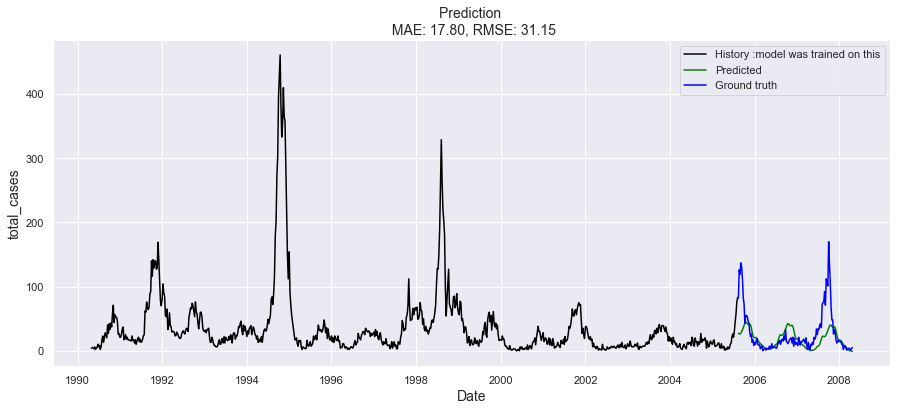

In [44]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(6)
f.set_figwidth(15)

# model.plot(y_pred, ax=ax)
sns.lineplot(x=train['ds'], y=train['y'], ax=ax, color='black', label='History :model was trained on this')
sns.lineplot(x=y_pred['ds'], y=y_pred['yhat'], ax=ax, color='green', label='Predicted')
sns.lineplot(x=x_valid['ds'], y=y_valid_actual['y'], ax=ax, color='blue', label='Ground truth') #navajowhite

ax.set_title(f'Prediction \n MAE: {score_mae:.2f}, RMSE: {score_rmse:.2f}', fontsize=14)
ax.set_xlabel(xlabel='Date', fontsize=14)
ax.set_ylabel(ylabel='total_cases', fontsize=14)

plt.show()

Observation : The fit on Validation looks pretty good

# G : Summary 

Based on the evaluation metrics, we could conclude that that Prophet Multivariate is the best of the three models.


SARIMA Univariate
MAE: 26.61751827644783
    
RMSE: 31.256617343290408

Prophet Univariate - hyperparameter tuned
MAE: 20.097238400619055
    
RMSE: 30.48416860386503

Prophet Multivariate - hyperparameter tuned
MAE: 17.799704613738257
    
RMSE: 31.153721966080738

# H : Predict Test Data

In [45]:
# Read the Test data
X_test = pd.read_csv("DengAI_Predicting_Disease_Spread_-_Test_Data_Features.csv", header = 0)

# Repeat the processing that was applied to training data
# Filter for SJ
X_test = df[df['city']=='sj']

# Create features
X_test = X_test.copy()
X_test['month'] = df_sj['week_start_date'].dt.month
X_test['dayofweek_character'] = pd.to_datetime(X_test['week_start_date']).dt.strftime("%A")
X_test['dayofweek_numeric'] = X_test['week_start_date'].dt.dayofweek
X_test['dayofmonth'] = X_test['week_start_date'].dt.day
X_test['season'] = X_test['month'] % 12 // 3 + 1
X_test['season_character']  = X_test['season'].map({1:'Winter', 2:'Spring', 3:'Summer', 4: 'Fall'})

# Rename data column to ds
X_test.rename({'week_start_date': 'ds'}, axis=1, inplace=True)

X_test.head()

,city,year,weekofyear,ds,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases,month,dayofweek_character,dayofweek_numeric,dayofmonth,season,season_character
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,295.9,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4,4,Monday,0,30,2,Spring
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,296.4,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5,5,Monday,0,7,2,Spring
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,297.3,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,4,5,Monday,0,14,2,Spring
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,297.0,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,3,5,Monday,0,21,2,Spring
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,297.5,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,6,5,Monday,0,28,2,Spring


In [46]:
fcst_prophet_test= m.predict(X_test)
fcst_prophet_test

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1990-04-30,52.854111,-33.591011,105.973015,52.854111,52.854111,-16.471418,-16.471418,-16.471418,-16.471418,-16.471418,-16.471418,0.0,0.0,0.0,36.382693
1,1990-05-07,52.813435,-27.225463,108.052278,52.813435,52.813435,-16.446217,-16.446217,-16.446217,-16.446217,-16.446217,-16.446217,0.0,0.0,0.0,36.367217
2,1990-05-14,52.772758,-31.158483,105.602807,52.772758,52.772758,-15.914447,-15.914447,-15.914447,-15.914447,-15.914447,-15.914447,0.0,0.0,0.0,36.858311
3,1990-05-21,52.732082,-31.882235,105.456458,52.732082,52.732082,-15.398007,-15.398007,-15.398007,-15.398007,-15.398007,-15.398007,0.0,0.0,0.0,37.334075
4,1990-05-28,52.691406,-35.230655,109.537201,52.691406,52.691406,-15.095854,-15.095854,-15.095854,-15.095854,-15.095854,-15.095854,0.0,0.0,0.0,37.595552
5,1990-06-04,52.650730,-31.520585,106.514259,52.650730,52.650730,-14.543943,-14.543943,-14.543943,-14.543943,-14.543943,-14.543943,0.0,0.0,0.0,38.106787
6,1990-06-11,52.610053,-28.835953,108.072454,52.610053,52.610053,-13.228054,-13.228054,-13.228054,-13.228054,-13.228054,-13.228054,0.0,0.0,0.0,39.382000
7,1990-06-18,52.569377,-29.372453,108.032295,52.569377,52.569377,-11.400438,-11.400438,-11.400438,-11.400438,-11.400438,-11.400438,0.0,0.0,0.0,41.168939
8,1990-06-25,52.528701,-26.868884,110.330085,52.528701,52.528701,-9.940867,-9.940867,-9.940867,-9.940867,-9.940867,-9.940867,0.0,0.0,0.0,42.587833
9,1990-07-02,52.488024,-23.637931,113.595467,52.488024,52.488024,-9.238729,-9.238729,-9.238729,-9.238729,-9.238729,-9.238729,0.0,0.0,0.0,43.249295


# I : Future improvements
The above analysis was done under time constraints and there is a lot of scope to improve the model.

Impute outliers.

Add Holidays list if available.

Add more features.

Analyse missing values better

Analyse outliers better 

Hyperparameter tune other parameters.

Improve cross-validation and hyper parameter tuning for current models.

Incorporate seasonality in the ARIMA model.

Repeat the analysis for IQ

Forecast for Test data.
